In [1]:

from dig.xgraph.dataset import *
from dig.xgraph.models import *
import torch
from torch_geometric.data import DataLoader
from torch_geometric.data import Data, InMemoryDataset, download_url, extract_zip
import os.path as osp
import os

import sys
import time

import pickle as pkl
from matplotlib import pyplot as plt
import networkx as nx
import numpy as np


from Extractor import Extractor
from scipy.sparse import coo_matrix,csr_matrix
#import tensorflow as tf
import torch
from utils import *
from model import *
from train import *

from explain import *
import time
from tqdm import tqdm
from sklearn.metrics import roc_auc_score
from torch_geometric.utils import to_networkx
import json
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
%load_ext autoreload
%autoreload 2

np.set_printoptions(threshold=sys.maxsize)

/home/grads/q/qf31/anaconda3/envs/graph/lib/python3.7/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 804: forward compatibility was attempted on non supported HW (Triggered internally at  /opt/conda/conda-bld/pytorch_1607370156314/work/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


In [2]:
dataset = SentiGraphDataset(root='./dataset', name='Graph-SST2')
dataset.len()

70042

In [3]:
dataset.data

Data(edge_index=[2, 1288566], x=[714325, 768], y=[70042])

In [4]:
train_len = int(0.8 * dataset.len())
test_len = dataset.len() - train_len

In [5]:
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_len, test_len])


In [7]:
#gcn_model = GCN(dataset, 3, 20)
gcn_model = torch.load('./checkpoint/gcn_sst_vis', map_location=torch.device(device))

In [7]:
train(gcn_model, train_dataset, test_dataset, max_epoch = 10, lr=0.001, save_model = True)

prepare dataloader
done
Epoch:  0 Avg loss:  0.3797652 ; acc:  0.82556707 ; epoch time:  6.103395223617554
eval test...
Epoch:  0 Avg loss:  0.32300624 ; acc:  0.8607324 ; epoch time:  2.226083517074585
saving...


Epoch:  1 Avg loss:  0.31011367 ; acc:  0.8660253 ; epoch time:  5.742526292800903
eval test...
Epoch:  0 Avg loss:  0.304937 ; acc:  0.86858445 ; epoch time:  1.7256042957305908
saving...


Epoch:  2 Avg loss:  0.29157433 ; acc:  0.87589455 ; epoch time:  6.103870630264282
eval test...
Epoch:  0 Avg loss:  0.2912092 ; acc:  0.8750803 ; epoch time:  1.8170030117034912
saving...


Epoch:  3 Avg loss:  0.2770381 ; acc:  0.88371134 ; epoch time:  6.269703149795532
eval test...
Epoch:  0 Avg loss:  0.3208987 ; acc:  0.86373043 ; epoch time:  1.6915202140808105


Epoch:  4 Avg loss:  0.26113313 ; acc:  0.89102846 ; epoch time:  6.198181629180908
eval test...
Epoch:  0 Avg loss:  0.2887046 ; acc:  0.8755086 ; epoch time:  1.5576434135437012
saving...


Epoch:  5 Avg loss:  0.24811

In [8]:
#gcn_model = torch.load('./checkpoint/gcn_mutag_temp')
eval(gcn_model, test_dataset)

Epoch:  0 Avg loss:  0.20639737 ; acc:  0.9191234 ; epoch time:  2.1697819232940674


array(0.9191234, dtype=float32)

In [89]:
#torch.save(gcn_model, './checkpoint/gcn_sst')

In [9]:
#new version with mean middle
def adjacent_process(data, node_range = None):
    '''
    transfer an edge_index to matrix hash map
    node_range: node list that is considered
    '''
    node_range = range(data.x.shape[0]) if node_range is None else node_range
    matrix = {}
    for n in node_range:
        matrix[n] = []
    

    for i in range(data.edge_index.shape[1]):
        r = int(data.edge_index[0][i])
        c = int(data.edge_index[1][i])
        if r not in node_range or c not in node_range:
            continue
        matrix[ r ].append( c )
    #print('=========A: ', matrix)
    return matrix

def if_connect(set_1, set_2, A):
    '''
    return if two sets connect to each other
    A is adjacent matrix hash map
    '''
    for i in set_1:
        for j in set_2:
            if j in A[i]:
                return True

    return False

def find_neighbor(node_list, A):
    '''
    find neighbor of node_list
    A : adjacent matrix
    '''

    ans = []
    for n in node_list:
        for ne in A[n]:
            if ne not in node_list and ne not in ans:
                ans.append(ne)

    return ans

def merge(comp_list, cand_list, A):
    '''
    merge new candidates node to old comp, aggregate linked group
    comp_list like: [[1,2], [3,4,5], [6]]
    cand_list like: [7,8,9]
    A: adjacent matrix hash map
    '''
    for cand in cand_list:
        new_comp_list = [[cand]]
        for comp in comp_list:
            if if_connect(new_comp_list[0], comp, A):
                new_comp_list[0].extend(comp)
            else:
                new_comp_list.append(comp)

        comp_list = new_comp_list

    return comp_list

def get_rw_score(load_model, data, class_idx, comp, A,softmax):
    # get neighbor
    #print('======= comp is:', comp)
    n_list = find_neighbor(comp, A)
    #print('======= its neighbor is ', n_list)
    score = get_score(load_model, data.to(device), [comp], softmax = softmax)[class_idx]['rel'][0]
    if len(n_list) == 0:
        return score
    else:
        for n in n_list:
            score += get_score(load_model, data.to(device), [comp + [n]], softmax = softmax)[class_idx]['rel'][0]
        return score / (len(n_list)+1)
def agglomerate(load_model, data, percentile = 60, class_idx = 0, node_range = None, softmax = False):
    class_idx = class_idx if class_idx is not None else (int)(dataset[idx].y[0])
    #print('======= class idx: ', class_idx)
    node_range = range(data.x.shape[0]) if node_range is None else node_range
    
    A = adjacent_process(data, node_range)
    # init build, every node score
    mask_list = []
    for i in node_range:
        mask_list.append([i])
    scores = []
    for m in mask_list:
        scores.append(get_rw_score(load_model, data, class_idx, m, A, softmax=softmax))
    #scores = get_score(load_model, data.to('cuda'), mask_list, softmax = softmax)[class_idx]['rel']
    #print('++++',scores)
    # mean sub
    #print('before scores: ', scores)
    scores = scores - np.mean(scores)
    scores = np.absolute(scores)
    #print('after scores: ', scores)

    thresh_hold = np.nanpercentile(scores, percentile)
    #cand_list = np.where(scores >= thresh_hold)[0].tolist()
    cand_list = np.take(node_range, np.where(scores >= thresh_hold)[0])
    cand_list = list(set(cand_list) & set(node_range))
    
    comp_list = merge([], cand_list, A)
    #print('comp_list: ', comp_list)

    # begin add nodes
    comp_all = []
    comp_all_score = []

    comp_all.append(mask_list.copy())
    #comp_all_score.append([ get_score(load_model, data.to('cuda'), [c], softmax = False)[class_idx]['rel'][0] for c in mask_list])
    comp_all_score.append([ get_rw_score(load_model, data, class_idx, c, A, softmax=softmax) for c in mask_list])

    comp_all.append(comp_list.copy())
    comp_all_score.append([ get_rw_score(load_model, data, class_idx, c, A, softmax=softmax) for c in comp_list])

    for _ in range(500):
        #print('###############loop: ', _ )
        # find neibors for each comp
        cand_list = []
        scores = []
        for comp in comp_list:
            neighbors = find_neighbor(comp, A)
            #print('comp ',comp, " : ", find_neighbor(comp, A))
            # score for each neighbor
            for n in neighbors:
                old_set = comp.copy()
                new_set = comp.copy()
                new_set.append(n)
                #print('old_Set: ', old_set)
                #print('new_Set: ', new_set)

                #scores.append(get_score(load_model, data.to('cuda'), [new_set], softmax = False)[class_idx]['rel'][0] -  get_score(load_model, data.to('cuda'), [old_set], softmax = False)[class_idx]['rel'][0])
                scores.append(get_rw_score(load_model, data, class_idx, new_set, A, softmax=softmax) -  get_rw_score(load_model, data, class_idx, old_set, A, softmax=softmax))

            cand_list.extend(neighbors)
        #print('cand_list: ', cand_list)
        #print('scores: ', scores)
        scores -= np.mean(scores)

        scores = np.absolute(scores)
        thresh_hold = np.nanpercentile(scores, percentile)
        #print('thresh_hold: ', thresh_hold)
        cand_list = np.take(cand_list, np.where(scores >= thresh_hold)[0])
        cand_list = np.unique(cand_list)
        #print(cand_list)
        #print(comp_list)
        # merge 
        comp_list = merge(comp_list, cand_list, A)
        #print(comp_list)
        comp_sum = np.sum([ len(c) for c in comp_list])
        #print([ len(a) for c in comp_list])
        #print('comp sum: ', comp_sum)
        comp_all.append(comp_list.copy())
        #comp_all_score.append([ get_score(load_model, data.to('cuda'), [c], softmax = False)[class_idx]['rel'][0] for c in comp_list])
        comp_all_score.append([ get_rw_score(load_model, data, class_idx, c, A, softmax=softmax) for c in comp_list])
        if len(node_range) <= comp_sum:
            #print('BBBBBBBBBBBBBRRRRRRRRRRRRRRREEEEEEEEEEEEEEKKKKKKKKKKKKKK')
            break

    #print('comp_all_score: ', comp_all_score)
    return comp_all, comp_all_score


In [10]:
import matplotlib
global edges
def hier_explain(dataset, model, idx, class_idx = None, visible = True, figsize = None, percentile = 75, path = None, **kwargs):
    global edges
    class_idx = int(class_idx) if class_idx is not None else (int)(dataset[idx].y[0])
    idx = int(idx)
    begin_time = time.time()
    data = get_data(dataset, idx)
    comp_all,comp_all_score = agglomerate(model, data,class_idx=class_idx, percentile = percentile, softmax=False)
    color_max = max([max(comp_score) for comp_score in comp_all_score]) 
    color_min = min([min(comp_score) for comp_score in comp_all_score]) 
    #color_max = 0.8
    #color_min = -0.8
    #print('color range: ', color_max, ' ', color_min)
    node_sizes = 2000
    if visible:
        

        G = to_networkx(dataset[idx])

        pos = nx.kamada_kawai_layout(G)

        #node_sizes = 600 * size_ratio
        #node_colors = class_score[class_idx]['rel']


        cmap = plt.cm.coolwarm
        if figsize is None:
            fig = plt.figure(figsize = (10 * len(comp_all),10),dpi=400, facecolor="white")
        else:
            fig = plt.figure(figsize = figsize ,dpi=400, facecolor="white")
        
        for layer in range(len(comp_all)):
            plt.subplot(1, len(comp_all), layer+1)

            #find white nodes
            white_nodes = set([n for n in range(data.x.shape[0])])
            comp_list = comp_all[layer]
            comp_score = comp_all_score[layer]


            # print comp nodes
            for i in range(len(comp_list)):
                white_nodes = white_nodes - set(comp_list[i])

                nodes = nx.draw_networkx_nodes(
                    G,
                    pos,
                    nodelist = comp_list[i],
                    node_size = node_sizes,
                    node_color = [comp_score[i]] * len(comp_list[i]),
                    cmap=cmap,
                    edgecolors='black',
                    vmax = color_max,
                    vmin = color_min,
                    alpha = 0.6,
                )


                edges = nx.draw_networkx_edges(
                    G.subgraph(comp_list[i]),
                    pos,
                    #node_size=node_sizes,
                    arrowstyle="-",
                    #arrowsize=10,
                    width=20,
                    connectionstyle= 'arc3, rad=0.2',
                    style='-.',
                    alpha=0.3,
                    edge_cmap = cmap,
                    edge_color = [comp_score[i]] * len(G.subgraph(comp_list[i]).edges),
                    edge_vmin = color_min,
                    edge_vmax = color_max,

                    
                )
            
            # print white nodes
            nodes_ = nx.draw_networkx_nodes(
                G,
                pos,
                nodelist = list(white_nodes),
                node_size = node_sizes,
                node_color = ['tab:gray'] * len(white_nodes),
                cmap=cmap,
                edgecolors='black',
                vmax = color_max,
                vmin = color_min,
                alpha = 0.3
            )

            edges = nx.draw_networkx_edges(
                G,
                pos,
                #node_size=node_sizes,
                arrowstyle="-",
                #arrowsize=10,
                width=2,
                #connectionstyle= 'arc, rad=0.2',
                style=':',
                alpha=0.3
            )
            label_list = {}
            for i in range(dataset[idx].x.shape[0]):
                label_list[i] = ''#str(i)
                if 'node_name_list' in kwargs:
                    node_name_idx = int(np.argmax(dataset[idx].x[i]))
                    label_list[i] += '' + kwargs['node_name_list'][node_name_idx]
                if 'text_dict' in kwargs:
                    label_list[i] += '' + kwargs['text_dict'][str(idx)][i]
                

            labels = nx.draw_networkx_labels(G, pos, label_list, font_size=18, font_color="black")
            #plt.colorbar(nodes)

            #ax = plt.gca()
            #ax.set_axis_off()
            #if layer+1 == 1:
            #    continue
            #plt.subplot(1, len(comp_all), layer+1)
            #print("layer", layer+1)
        #plt.colorbar(nodes)
        if path is None:
            plt.show()
        else:
            plt.savefig(path + str(idx) + '.png' , dpi=400)

In [15]:
with open('dataset/Graph-SST2/raw/Graph-SST2_sentence_tokens.json') as f:
  text_dict = json.load(f)

kwargs = {}
kwargs['text_dict'] = text_dict

In [16]:
load_model = gcn_model
data = get_data(dataset, 64)
comp_all,comp_all_score = agglomerate(load_model, data, percentile=65)

======= class idx:  0
=========A:  {0: [1], 1: [0, 2, 4, 5, 8], 2: [1], 3: [4], 4: [1, 3], 5: [1, 7], 6: [7], 7: [5, 6], 8: [1, 9], 9: [8, 15], 10: [15], 11: [15], 12: [15], 13: [15], 14: [15], 15: [9, 10, 11, 12, 13, 14]}
======= comp is: [0]
======= its neighbor is  [1]
======= comp is: [1]
======= its neighbor is  [0, 2, 4, 5, 8]
======= comp is: [2]
======= its neighbor is  [1]
======= comp is: [3]
======= its neighbor is  [4]
======= comp is: [4]
======= its neighbor is  [1, 3]
======= comp is: [5]
======= its neighbor is  [1, 7]
======= comp is: [6]
======= its neighbor is  [7]
======= comp is: [7]
======= its neighbor is  [5, 6]
======= comp is: [8]
======= its neighbor is  [1, 9]
======= comp is: [9]
======= its neighbor is  [8, 15]
======= comp is: [10]
======= its neighbor is  [15]
======= comp is: [11]
======= its neighbor is  [15]
======= comp is: [12]
======= its neighbor is  [15]
======= comp is: [13]
======= its neighbor is  [15]
======= comp is: [14]
======= its neighbo

In [13]:
data

Batch(batch=[7], edge_index=[2, 12], x=[7, 768], y=[1])

In [14]:
data = get_data(dataset, 69941)
data.y

tensor([0])

In [15]:
data = get_data(dataset, 69941).to('cuda')
pred = load_model.forward(data)
pred

tensor([[-0.7505, -0.6389]], device='cuda:0', grad_fn=<LogSoftmaxBackward>)

In [44]:
hier_explain(dataset, load_model, idx = 69941, class_idx = 0, figsize = None, percentile = 50, **kwargs)

======= class idx:  0
=========A:  {0: [3], 1: [3], 2: [3], 3: [0, 1, 2, 5, 6, 7], 4: [5], 5: [3, 4], 6: [3], 7: [3, 12], 8: [12], 9: [10], 10: [12, 9], 11: [12], 12: [7, 8, 10, 11, 13], 13: [12, 15], 14: [15], 15: [13, 14, 16, 19], 16: [15], 17: [19], 18: [19], 19: [15, 17, 18, 22, 25], 20: [22], 21: [22], 22: [19, 20, 21, 23], 23: [22, 24], 24: [23], 25: [19]}
======= comp is: [0]
======= its neighbor is  [3]
======= comp is: [1]
======= its neighbor is  [3]
======= comp is: [2]
======= its neighbor is  [3]
======= comp is: [3]
======= its neighbor is  [0, 1, 2, 5, 6, 7]
======= comp is: [4]
======= its neighbor is  [5]
======= comp is: [5]
======= its neighbor is  [3, 4]
======= comp is: [6]
======= its neighbor is  [3]
======= comp is: [7]
======= its neighbor is  [3, 12]
======= comp is: [8]
======= its neighbor is  [12]
======= comp is: [9]
======= its neighbor is  [10]
======= comp is: [10]
======= its neighbor is  [12, 9]
======= comp is: [11]
======= its neighbor is  [12]
====

KeyboardInterrupt: 

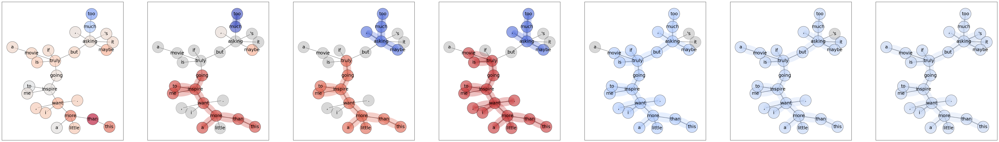

In [48]:
hier_explain(dataset, load_model, idx = 69941, class_idx = 1, figsize = None, percentile = 50, **kwargs)

In [49]:
data = get_data(dataset, 64)
data.y

tensor([0])

In [50]:
data = get_data(dataset, 64).to('cuda')
pred = load_model.forward(data)
pred

tensor([[-0.0106, -4.5501]], device='cuda:0', grad_fn=<LogSoftmaxBackward>)

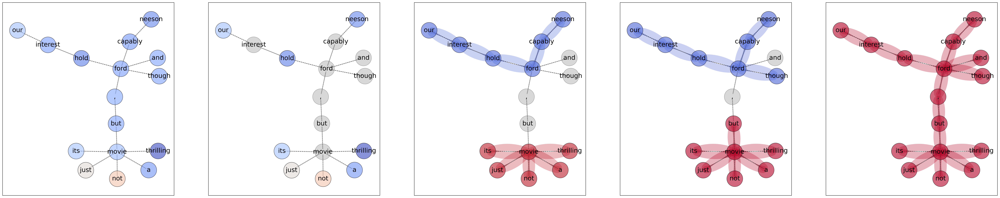

In [55]:
hier_explain(dataset, load_model, idx = 64, class_idx = 0, figsize = None, percentile = 50, **kwargs)

In [56]:
data = get_data(dataset, 342)
data.y

tensor([1])

In [57]:
data = get_data(dataset, 342).to('cuda')
pred = load_model.forward(data)
pred

tensor([[-8.4481e+00, -2.1432e-04]], device='cuda:0',
       grad_fn=<LogSoftmaxBackward>)

======= class idx:  1
=========A:  {0: [1], 1: [7, 0, 2, 22], 2: [1], 3: [6], 4: [6], 5: [6], 6: [7, 3, 4, 5], 7: [1, 6, 8], 8: [7, 9], 9: [8], 10: [22, 11], 11: [10, 12], 12: [11, 13], 13: [12, 15], 14: [15], 15: [13, 14, 16, 17, 18], 16: [15], 17: [15], 18: [15], 19: [22], 20: [22], 21: [22], 22: [1, 10, 19, 20, 21]}
======= comp is: [0]
======= its neighbor is  [1]
======= comp is: [1]
======= its neighbor is  [7, 0, 2, 22]
======= comp is: [2]
======= its neighbor is  [1]
======= comp is: [3]
======= its neighbor is  [6]
======= comp is: [4]
======= its neighbor is  [6]
======= comp is: [5]
======= its neighbor is  [6]
======= comp is: [6]
======= its neighbor is  [7, 3, 4, 5]
======= comp is: [7]
======= its neighbor is  [1, 6, 8]
======= comp is: [8]
======= its neighbor is  [7, 9]
======= comp is: [9]
======= its neighbor is  [8]
======= comp is: [10]
======= its neighbor is  [22, 11]
======= comp is: [11]
======= its neighbor is  [10, 12]
======= comp is: [12]
======= its neigh

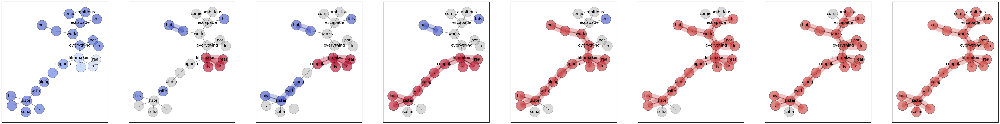

In [27]:
hier_explain(dataset, load_model, idx = 342, class_idx = 1, figsize = None, percentile = 60, **kwargs)

In [67]:
data = get_data(dataset, 1078)
data.y

tensor([0])

In [68]:
data = get_data(dataset, 1078).to('cuda')
pred = load_model.forward(data)
pred

tensor([[-0.2574, -1.4830]], device='cuda:0', grad_fn=<LogSoftmaxBackward>)

======= class idx:  0
=========A:  {0: [5, 2], 1: [2], 2: [0, 1], 3: [5], 4: [5], 5: [0, 3, 4, 6, 8, 9, 13], 6: [5], 7: [8], 8: [5, 7], 9: [5], 10: [13], 11: [13], 12: [13], 13: [5, 10, 11, 12, 14], 14: [13, 15], 15: [14, 17, 19], 16: [17], 17: [15, 16], 18: [19], 19: [15, 18, 20, 21], 20: [19], 21: [19]}
======= comp is: [0]
======= its neighbor is  [5, 2]
======= comp is: [1]
======= its neighbor is  [2]
======= comp is: [2]
======= its neighbor is  [0, 1]
======= comp is: [3]
======= its neighbor is  [5]
======= comp is: [4]
======= its neighbor is  [5]
======= comp is: [5]
======= its neighbor is  [0, 3, 4, 6, 8, 9, 13]
======= comp is: [6]
======= its neighbor is  [5]
======= comp is: [7]
======= its neighbor is  [8]
======= comp is: [8]
======= its neighbor is  [5, 7]
======= comp is: [9]
======= its neighbor is  [5]
======= comp is: [10]
======= its neighbor is  [13]
======= comp is: [11]
======= its neighbor is  [13]
======= comp is: [12]
======= its neighbor is  [13]
======= c

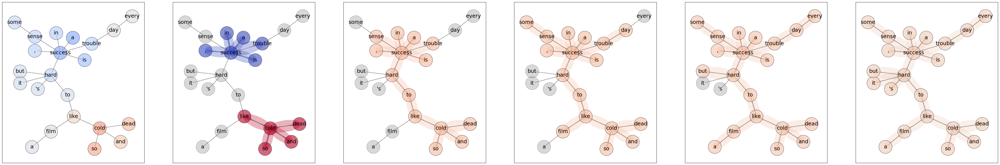

In [29]:
hier_explain(dataset, load_model, idx = 1078, class_idx = None, figsize = None, percentile = 50, **kwargs)

In [72]:
data = get_data(dataset, 1279)
data.y

tensor([1])

In [73]:
data = get_data(dataset, 1279).to('cuda')
pred = load_model.forward(data)
pred

tensor([[-2.1079, -0.1295]], device='cuda:0', grad_fn=<LogSoftmaxBackward>)

======= class idx:  1
=========A:  {0: [1, 3], 1: [0], 2: [3], 3: [0, 2, 6], 4: [6], 5: [6], 6: [3, 4, 5, 8], 7: [8], 8: [6, 7, 9], 9: [8, 11], 10: [11], 11: [9, 10, 12], 12: [11, 15], 13: [15], 14: [15], 15: [12, 13, 14, 16, 20], 16: [15], 17: [20], 18: [20], 19: [20], 20: [15, 17, 18, 19, 21], 21: [20, 22], 22: [21, 24], 23: [24], 24: [22, 23, 25], 25: [24]}
before scores:  [-0.007470159325748682, -0.0033887240570038557, -0.007290611509233713, 0.06609565019607544, -0.04748699069023132, -0.2636950612068176, -0.15960484743118286, -0.0714028924703598, -0.3181084990501404, -0.018064022064208984, 0.0, 0.007463444489985704, 0.04645262658596039, 0.16879910230636597, 0.013816189020872116, 0.3415716588497162, 0.012010958045721054, 0.04330522567033768, 0.23616597056388855, 0.2538392245769501, 0.8709067106246948, 0.28313589096069336, 0.1482430249452591, 0.33282670378685, 0.7767943143844604, 0.07268929481506348]
after scores:  [0.11430109 0.11021965 0.11412154 0.04073528 0.15431792 0.37052599
 0

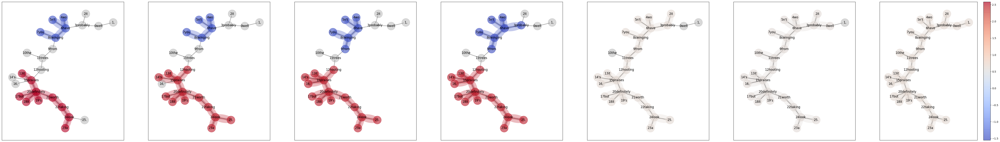

In [75]:
hier_explain(dataset, load_model, idx = 1279, class_idx = None, figsize = None, percentile = 60, **kwargs)

In [84]:
data = get_data(dataset, 1771)
data.y

tensor([0])

In [85]:
data = get_data(dataset, 1771).to('cuda')
pred = load_model.forward(data)
pred

tensor([[-0.0558, -2.9135]], device='cuda:0', grad_fn=<LogSoftmaxBackward>)

======= class idx:  0
=========A:  {0: [9, 3], 1: [3], 2: [3], 3: [0, 1, 2, 4, 5, 6], 4: [3], 5: [3], 6: [3], 7: [9], 8: [9], 9: [0, 7, 8, 10], 10: [9, 11, 12], 11: [10], 12: [10]}
before scores:  [0.11948990821838379, -0.14102880656719208, -0.0974678099155426, -0.8198903203010559, -0.06347757577896118, -0.49671730399131775, -0.26763463020324707, 0.14267311990261078, 0.16647754609584808, 0.2554260194301605, 0.2141740471124649, 0.14560212194919586, 0.7731971144676208]
after scores:  [0.12481118 0.13570753 0.09214654 0.81456905 0.0581563  0.49139603
 0.26231336 0.14799439 0.17179882 0.26074729 0.21949532 0.1509234
 0.77851839]
comp_list:  [[6, 5, 3], [12]]
###############loop:  0
comp  [6, 5, 3]  :  [0, 1, 2, 4]
======= comp is: [6, 5, 3, 0]
======= its neighbor is  [1, 2, 4, 9]
======= comp is: [6, 5, 3]
======= its neighbor is  [0, 1, 2, 4]
======= comp is: [6, 5, 3, 1]
======= its neighbor is  [0, 2, 4]
======= comp is: [6, 5, 3]
======= its neighbor is  [0, 1, 2, 4]
======= comp is: 

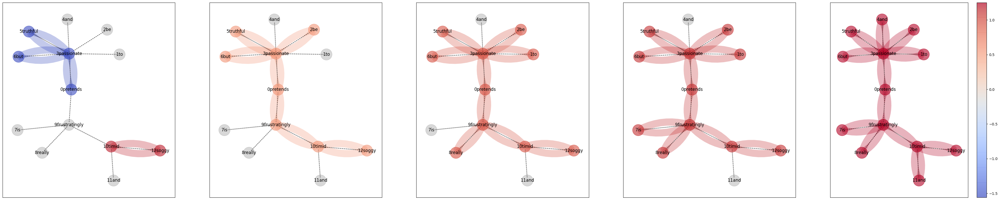

In [88]:
hier_explain(dataset, load_model, idx = 1771, class_idx = None, figsize = None, percentile = 70, **kwargs)

In [90]:
data = get_data(dataset, 68225)
data.y


tensor([1])

In [91]:
data = get_data(dataset, 68225).to('cuda')
pred = load_model.forward(data)
pred

tensor([[-6.6027e+00, -1.3576e-03]], device='cuda:0',
       grad_fn=<LogSoftmaxBackward>)

In [2]:
hier_explain(dataset, load_model, idx = 68227, class_idx = None, figsize = None, percentile = 70, **kwargs)

NameError: name 'hier_explain' is not defined

In [32]:
model = load_model
loader = DataLoader(dataset, batch_size=dataset.len(), shuffle=False)
model.eval()


for batch_idx, data in enumerate(loader):
    #print(data.batch)
    #optimizer.zero_grad()
    data = data.to(device)
    preds = model.forward(data)
    #print(preds)
    label = data.y.to(device)
    loss = model.loss(preds, label)
    _, indices = torch.max(preds, 1)

In [33]:
correct = np.where(np.array((indices == label).to("cpu")) == 1)[0]
incorrect = np.where(np.array((indices == label).to("cpu")) == 0)[0]

In [37]:
len(correct)

64294

In [1]:
import random
from tqdm import tqdm
rand_correct = random.sample(range(len(correct)), 500)
rand_incorrect = random.sample(range(len(incorrect)), 500)

NameError: name 'correct' is not defined

In [60]:
for r in tqdm(rand_correct):
    data = get_data(dataset, r)
    if 10 <= data.x.shape[0] <= 30:
        hier_explain(dataset, load_model, idx = r, class_idx = None, figsize = None, percentile = 50, path='./SST_VIS/CORRECT/', **kwargs)

  1%|          | 4/500 [00:44<1:31:44, 11.10s/it]


KeyboardInterrupt: 